In [31]:
import pandas as pd
import pygmt
from matplotlib.colors import to_hex
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
from matplotlib.colors import ListedColormap
import seaborn as sns
import numpy as np

In [32]:
geo_wa=pd.read_csv('./geological_map/waor_station_geology.csv')
geo_wa.head(5)

,netst,stlo,stla,geometry,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,UNIT_NAME,...,INDETERMIN,REF_ID,REFERENCE,GENERALIZE,DIGITAL_UR,NGMDB1,NGMDB2,NGMDB3,RuleID,FIPS_C
0,CC.ASBU,-121.368401,43.820560,POINT (-121.368401 43.82056),9310.0,OR,Qyb,Qyb;0,ORQyb;0,Youngest basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
1,CC.BRSP,-121.708427,45.401550,POINT (-121.708427 45.40155),5175.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
2,CC.CARB,-122.005409,46.988319,POINT (-122.005409 46.988319),310.0,WA,E2,EO2;0,WAEO2;0,Lower upper Eocene marine and nonmarine rocks,...,NaN,WA097,"Raines, Gary L., and Johnson, Bruce R., 1996, ...","Sedimentary, clastic",https://pubs.usgs.gov/of/1995/of95-684/,https://ngmdb.usgs.gov/Prodesc/proddesc_30777.htm,NaN,NaN,23.0,53.0
3,CC.CIHL,-121.148621,43.750969,POINT (-121.148621 43.750969),5796.0,OR,Qb,Qb;0,ORQb;0,Basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
4,CC.CLBH,-122.143494,42.907745,POINT (-122.143494 42.907745),5168.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0


In [33]:
geo_ca=pd.read_csv('./geological_map/ca_station_geology.csv')
geo_ca.head(5)

,netst,stla,stlo,geometry,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,UNIT_NAME,...,INDETERMIN,REF_ID,REFERENCE,GENERALIZE,DIGITAL_UR,NGMDB1,NGMDB2,NGMDB3,RuleID,FIPS_C
0,CI.ALP,34.687080,-118.299461,POINT (-118.299461 34.68708),4810,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6
1,CI.ARV,35.126900,-118.830093,POINT (-118.830093 35.1269),2786,CA,M,MI;0,CAMI;0,Miocene marine rocks,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Sedimentary, clastic",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,23,6
2,CI.BAI,34.776951,-118.773354,POINT (-118.773354 34.776951),2829,CA,M,MI;0,CAMI;0,Miocene marine rocks,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Sedimentary, clastic",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,23,6
3,CI.BAK,35.344440,-119.104446,POINT (-119.104446 35.34444),4830,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6
4,CI.BBR,34.262299,-116.920753,POINT (-116.920753 34.262299),4848,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6


In [34]:
geo_in=pd.concat([geo_wa,geo_ca])

In [35]:
geo_df=geo_in[['netst',
               'stlo',
               'stla',
               'STATE',
               'GENERALIZE',
               'MAJOR1']]

In [36]:
geo_df.dropna(subset=['GENERALIZE'],inplace=True)

/tmp/ipykernel_592990/2092695932.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_df.dropna(subset=['GENERALIZE'],inplace=True)


In [37]:
rock_types=geo_df['GENERALIZE'].unique()
rock_types

array(['Igneous, volcanic', 'Sedimentary, clastic',
       'Unconsolidated, undifferentiated', 'Igneous, undifferentiated',
       'Igneous, intrusive',
       'Metamorphic and Sedimentary, undifferentiated',
       'Metamorphic, sedimentary', 'Water',
       'Igneous and Sedimentary, undifferentiated',
       'Metamorphic, serpentinite', 'Metamorphic, schist',
       'Metamorphic, sedimentary clastic',
       'Unconsolidated and Sedimentary, undifferentiated',
       'Sedimentary, carbonate', 'Metamorphic, volcanic',
       'Metamorphic, gneiss', 'Igneous and Metamorphic, undifferentiated',
       'Sedimentary, undifferentiated'], dtype=object)

In [38]:
geo_df2 = geo_df.dropna(subset=['stlo', 'stla', 'GENERALIZE'])

geo_colors = {
    # **Unconsolidated Rocks** (Yellow to orange gradient)
    'Unconsolidated, undifferentiated': '#FFEB3B',   # Bright yellow (light yellow)
    'Unconsolidated and Sedimentary, undifferentiated': '#FF9800',  # Orange (for undifferentiated sediments)

    # **Sedimentary Rocks** (Yellow-based to orange and brown tones)
    'Sedimentary, clastic': '#FFB300',               # Amber yellow (clastic sedimentary)
    'Sedimentary, carbonate': '#FBC02D',             # Golden yellow (carbonate sedimentary)
    'Sedimentary, undifferentiated': '#F57C00',      # Burnt orange (undifferentiated sedimentary)

    # **Igneous Rocks** (Red-based for volcanic and purple-based for intrusive)
    'Igneous, volcanic': '#D32F2F',                  # Deep red (for volcanic)
    'Igneous, intrusive': '#9C27B0',                 # Purple-based (for intrusive igneous)
    'Igneous, undifferentiated': '#E57373',          # Light red (undifferentiated igneous)
    'Igneous and Sedimentary, undifferentiated': '#F06292', # Pinkish red (mixed igneous and sedimentary)

    # **Metamorphic Rocks** (Green-based with variations)
    'Metamorphic, sedimentary': '#66BB6A',           # Light green (for sedimentary metamorphics)
    'Metamorphic, schist': '#2E7D32',                # Deep green (for schist)
    'Metamorphic, serpentinite': '#81C784',          # Soft green (for serpentinite)
    'Metamorphic, volcanic': '#388E3C',              # Forest green (for volcanic metamorphics)
    'Metamorphic, gneiss': '#1B5E20',                # Dark green (for gneiss)
    'Metamorphic and Sedimentary, undifferentiated': '#43A047', # Medium green (undifferentiated metamorphics)
    'Metamorphic, sedimentary clastic': '#4CAF50',   # Fresh green (for clastic metamorphics)
    'Igneous and Metamorphic, undifferentiated': '#8E24AA', # Violet-green mix (for igneous/metamorphic undifferentiated)

    # **Water** (Clear and bright blue)
    'Water': '#80D8FF',                              # Soft turquoise-blue (for water)

    # **NaN or Missing Data** (Neutral gray)
    None: '#BDBDBD',                                 # Light gray for undefined or NaN entries
    # 'nan': '#BDBDBD'                                 # Handling 'nan' as a string explicitly if needed
}



# Map geological units to colors
geo_df2['color'] = geo_df2['GENERALIZE'].map(geo_colors).fillna('#d3d3d3') 


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


Unconsolidated, undifferentiated #FFEB3B
Unconsolidated and Sedimentary, undifferentiated #FF9800
Sedimentary, clastic #FFB300
Sedimentary, carbonate #FBC02D
Sedimentary, undifferentiated #F57C00
Igneous, volcanic #D32F2F
Igneous, intrusive #9C27B0
Igneous, undifferentiated #E57373
Igneous and Sedimentary, undifferentiated #F06292
Metamorphic, sedimentary #66BB6A
Metamorphic, schist #2E7D32
Metamorphic, serpentinite #81C784
Metamorphic, volcanic #388E3C
Metamorphic, gneiss #1B5E20
Metamorphic and Sedimentary, undifferentiated #43A047
Metamorphic, sedimentary clastic #4CAF50
Igneous and Metamorphic, undifferentiated #8E24AA
Water #80D8FF
None #BDBDBD


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


Unconsolidated, undifferentiated #FFEB3B
Unconsolidated and Sedimentary, undifferentiated #FF9800
Sedimentary, clastic #FFB300
Sedimentary, carbonate #FBC02D
Sedimentary, undifferentiated #F57C00
Igneous, volcanic #D32F2F
Igneous, intrusive #9C27B0
Igneous, undifferentiated #E57373
Igneous and Sedimentary, undifferentiated #F06292
Metamorphic, sedimentary #66BB6A
Metamorphic, schist #2E7D32
Metamorphic, serpentinite #81C784
Metamorphic, volcanic #388E3C
Metamorphic, gneiss #1B5E20
Metamorphic and Sedimentary, undifferentiated #43A047
Metamorphic, sedimentary clastic #4CAF50
Igneous and Metamorphic, undifferentiated #8E24AA
Water #80D8FF
None #BDBDBD


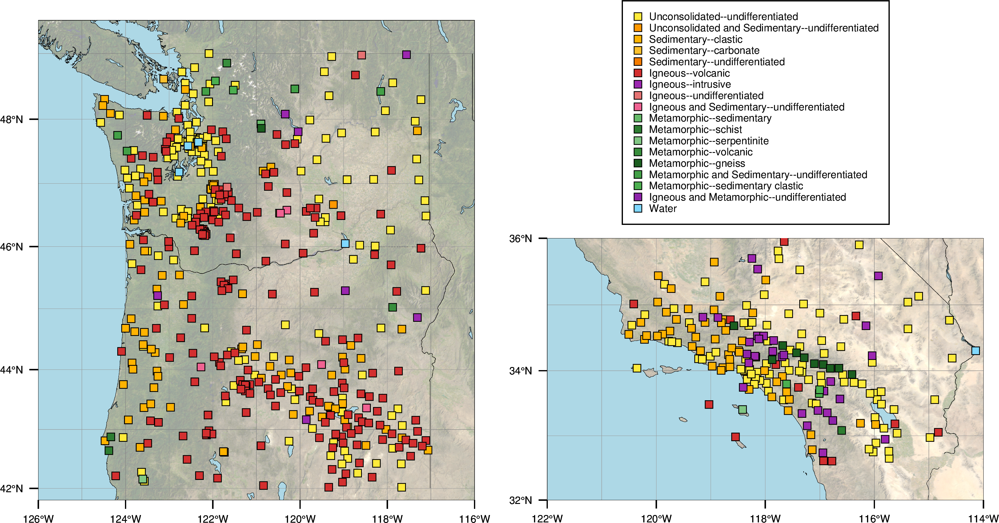

In [39]:
# PyGMT Plot
fig = pygmt.Figure()
region=[-126,-116,41.8,49.5]
proj='M6c'

pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )
fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)

# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    print(unit, color)
    geo_plot = geo_df2[geo_df2['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo'],
                y=geo_plot['stla'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=f'{formatted_label}'
        )

fig.legend(position="JMR+o0.8i", box="+gwhite+p0.4p")
fig.shift_origin(xshift="7c")

region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    print(unit, color)
    geo_plot = geo_df2[geo_df2['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo"],
            y=geo_plot["stla"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )


fig.show(dpi=600)



In [40]:
print(geo_df.MAJOR1.unique())

['Basaltic-andesite' 'Siltstone' 'Basalt' 'Rhyolite' 'Sandstone' 'Clay'
 'Silt' 'Andesite' 'Sand' 'Fine-detrital' 'Quartz-monzonite' 'Granite'
 'Graywacke' 'Gravel' 'Metasedimentary' nan 'Arkose' 'Mudstone' 'Gabbro'
 'Sandstone-mudstone' 'Quartz-diorite' 'Coarse-detrital' 'Mixed-clastic'
 'Serpentinite' 'Pelitic-schist' 'Volcanic' 'Phyllite' 'Conglomerate'
 'Limestone' 'Greenstone' 'Gneiss' 'Metaandesite' 'Hypabyssal-basalt'
 'Plutonic' 'Orthogneiss' 'Shale' 'Anorthosite' 'Tonalite' 'Argillite'
 'Felsic-volcanic' 'Granodiorite' 'Diorite' 'Hypabyssal-rhyolite' 'Dacite']


In [41]:
geo_major = geo_df.dropna(subset=['stlo', 'stla', 'MAJOR1'])

# Define color dictionary for geological units
major_colors = {
    # **Sedimentary Rocks** (Yellow-based gradient, yellow to orange)
    'Siltstone': '#FFEB3B',              # Bright yellow
    'Sandstone': '#FFB300',              # Darker yellow-orange
    'Clay': '#FF6F00',                  # Deep amber-orange
    'Silt': '#FFF176',                  # Pale yellow (lighter)
    'Fine-detrital': '#FF9800',          # Strong orange
    'Graywacke': '#FF5722',             # Orange-red
    'Arkose': '#F57C00',                # Intense amber-orange
    'Mudstone': '#E65100',              # Dark amber-orange
    'Conglomerate': '#D32F2F',          # Red-orange
    'Limestone': '#FF7043',             # Peachy-orange
    'Sandstone-mudstone': '#FF5722',    # Reddish-orange
    'Mixed-clastic': '#E64A19',         # Orange-red
    'Coarse-detrital': '#BF360C',       # Dark orange-red
    'Shale': '#F9A825',                 # Amber-yellow with slight orange
    'Gravel': '#B59A5B',                # Beige with brown undertones
    'Argillite': '#FF6F00',             # Amber-orange
    'Sand': '#FFB300',                 # Darker yellow-orange

    # **Volcanic Rocks** (Purple-based gradient, dark purple to lavender)
    'Basaltic-andesite': '#512DA8',     # Dark purple
    'Basalt': '#3F51B5',                # Dark bluish purple
    'Rhyolite': '#5E35B1',              # Medium dark purple
    'Andesite': '#7E57C2',              # Medium purple
    'Granite': '#9C27B0',               # Vibrant purple
    'Volcanic': '#8E24AA',              # Purple-pink
    'Metaandesite': '#9C27B0',          # Rich purple
    'Hypabyssal-basalt': '#7B1FA2',     # Deep purple with pinkish tint
    'Hypabyssal-rhyolite': '#AB47BC',   # Lavender purple
    'Dacite': '#512DA8',                # Dark purple, same as basaltic-andesite
    'Granodiorite': '#4CAF50',          # Purple with brownish tones

    # **Metamorphic Rocks** (Green-based gradient)
    'Metasedimentary': '#66BB6A',       # Light green
    'Pelitic-schist': '#4CAF50',         # Medium green
    'Serpentinite': '#2E7D32',           # Dark green
    'Phyllite': '#388E3C',              # Medium dark green
    'Gneiss': '#2C6B31',                # Deep green
    'Schist': '#1B5E20',                # Dark green
    'Mica-schist': '#388E3C',           # Rich green
    'Slate': '#43A047',                 # Bright green
    'Metamorphic': '#1B5E20',           # Dark forest green
    'Amphibolite': '#2E7D32',           # Deep green with slight yellow
    'Orthogneiss': '#66BB6A',           # Soft green, slightly grayish

    # **Other Rock Types**
    'Water': '#80D8FF',                # Soft turquoise-blue
    'Greenstone': '#A8D58B',           # Soft mint green
    'Plutonic': '#388E3C',             # Greenish stone-like, similar to Metamorphic
    'Anorthosite': '#80D8FF',          # Turquoise-greenish
    'Tonalite': '#9C27B0',             # Purple hue with slight bluish tinge
    'Quartz-monzonite': '#9C27B0',     # Vibrant purple, same as granite
    'Gabbro': '#3F51B5',               # Bluish dark green
    'Quartz-diorite': '#512DA8',       # Dark purple with grayish tones
    'Diorite': '#7E57C2',              # Medium purple
    'Felsic-volcanic': '#9C27B0',      # Bright vibrant purple, similar to granite
}



# Map geological units to colors
geo_major['color'] = geo_major['MAJOR1'].map(major_colors).fillna('#d3d3d3') 


/tmp/ipykernel_592990/1836539442.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_major['color'] = geo_major['MAJOR1'].map(major_colors).fillna('#d3d3d3')


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


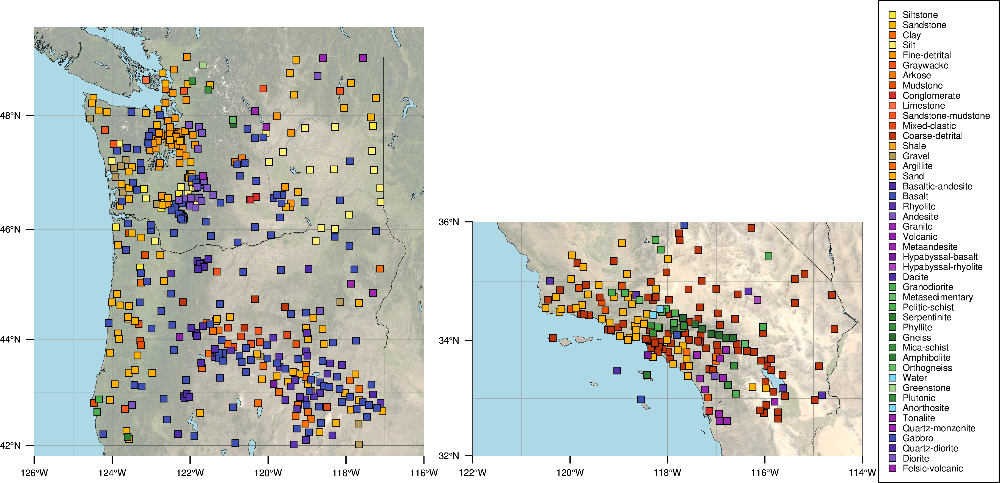

In [42]:
# Load CSV data
df = geo_major
region=[-126,-116,41.8,49.5]
proj='M6c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
            
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = geo_major[geo_major['color'] == color]
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo'],
                y=geo_plot['stla'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=unit
                )
fig.shift_origin(xshift="7c")
fig.legend(position="JMR", box="+gwhite+p0.4p",)
fig.shift_origin(xshift="-0.25c")

region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = geo_major[geo_major['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo"],
            y=geo_plot["stla"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )


fig.show(dpi=600)

In [43]:
pd_pnwbb=pd.read_csv('attenuation_PNW/sta_waro_vs30.csv')
pd_cabb=pd.read_csv('attenuation_SouthCA/sta_CI_vs30.csv')
pd_comb=pd.concat([pd_pnwbb,pd_cabb])

In [44]:
# Merging pd1 with pd2 on the 'netst' column
merged_geo = pd_comb.merge(geo_df, on='netst', how='left')
merged_geo = merged_geo[merged_geo.meanb > 0.01]

# Display the merged DataFrame
merged_geo.to_csv('merged_geo.csv', index=False)

In [45]:
merged_geo.head(5)

,Unnamed: 0,fband,netst,stlo_x,stla_x,meanb,meanQ,ncount,nearest_lon,nearest_lat,vs30,stlo_y,stla_y,STATE,GENERALIZE,MAJOR1
0,0,0.5-1.0,LI.LTH,-119.417679,46.461700,0.080000,58.905,2,-119.4174,46.4613,266.2870,-119.417679,46.461700,WA,"Unconsolidated, undifferentiated",Fine-detrital
2,2,0.5-1.0,TA.I05A,-121.267502,44.162601,0.316667,14.894,3,-121.2674,44.1633,425.7540,-121.267502,44.162601,OR,"Unconsolidated, undifferentiated",Clay
5,5,0.5-1.0,XN.B05,-125.766998,58.930500,0.050000,94.248,1,-123.0833,49.0012,324.2436,NaN,NaN,NaN,NaN,NaN
6,6,0.5-1.0,XN.B12,-131.744400,59.932999,0.110000,42.840,1,-124.7213,48.3872,605.8344,NaN,NaN,NaN,NaN,NaN
7,7,0.5-1.0,XN.C02,-122.713898,58.096500,0.020000,235.619,1,-122.7133,49.0012,426.8878,NaN,NaN,NaN,NaN,NaN


In [46]:
# Map geological units to colors
merged_geo['color_major'] = merged_geo['MAJOR1'].map(major_colors).fillna('#d3d3d3') 
merged_geo['color_gener'] = merged_geo['GENERALIZE'].map(geo_colors).fillna('#d3d3d3') 


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


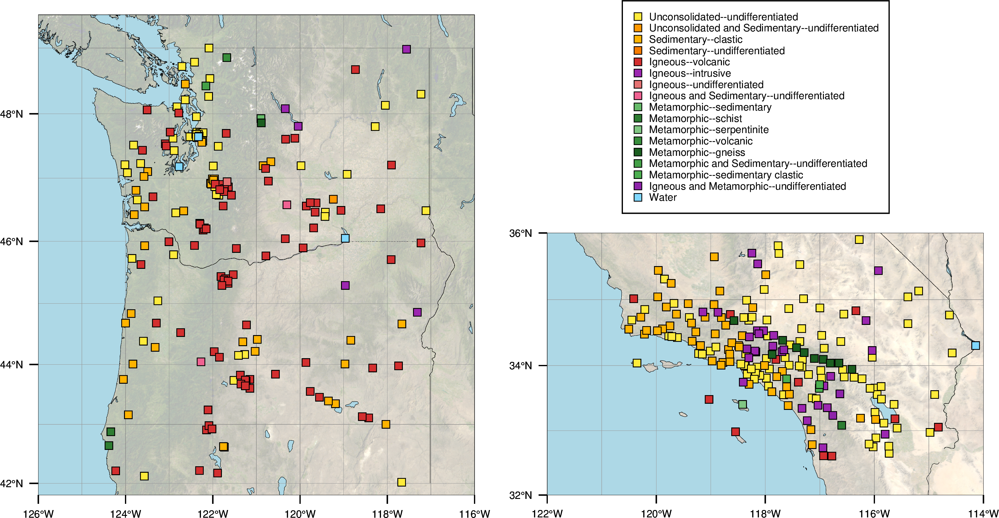

In [47]:
df=merged_geo

# PyGMT Plot
fig = pygmt.Figure()
region=[-126,-116,41.8,49.5]
proj='M6c'

pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=70, )
fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)

# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    geo_plot = df[df['color_gener'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo_x'],
                y=geo_plot['stla_x'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=f'{formatted_label}'
        )

fig.legend(position="JMR+o0.8i", box="+gwhite+p0.4p")
fig.shift_origin(xshift="7c")

region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=70, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    geo_plot = df[df['color_gener'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo_x"],
            y=geo_plot["stla_x"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )


fig.savefig(fname='GEOgenermap_histo.png' , dpi=600)

fig.show(dpi=600)

coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


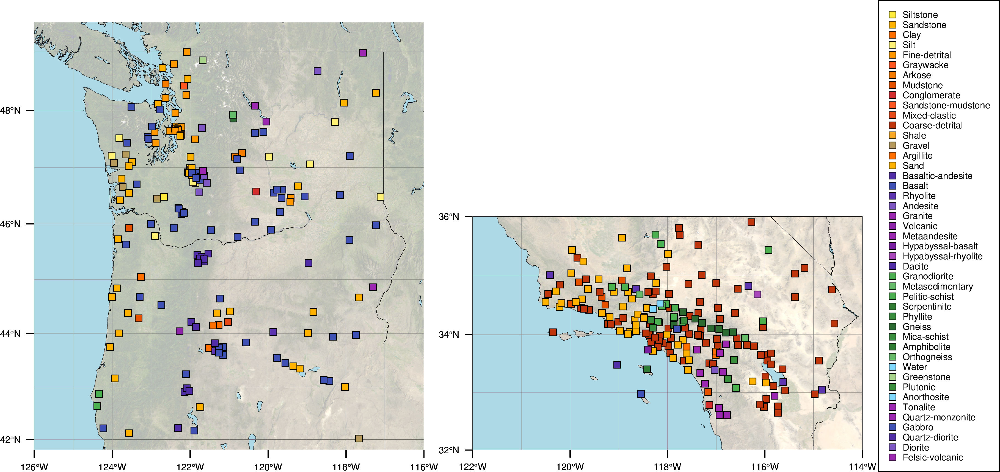

In [48]:
df=merged_geo

# PyGMT Plot
fig = pygmt.Figure()
region=[-126,-116,41.8,49.5]
proj='M6c'

pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=70, )
fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)

# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = df[df['color_major'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo_x'],
                y=geo_plot['stla_x'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=f'{formatted_label}'
        )

fig.shift_origin(xshift="7c")
fig.legend(position="JMR", box="+gwhite+p0.4p",)
fig.shift_origin(xshift="-0.25c")

region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=70, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = df[df['color_major'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo_x"],
            y=geo_plot["stla_x"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )
        
fig.savefig(fname='GEOunitmap_histo.png' , dpi=600)
fig.show(dpi=600)

In [49]:
# -122, -121.4, 46.7, 47
MtRainer=merged_geo[(merged_geo.stlo_x >-122) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >46.7) & (merged_geo.stla_x <47)]
# -121.9, -121.4, 45, 45.5
MtHood=merged_geo[(merged_geo.stlo_x >-121.9) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >45) & (merged_geo.stla_x <45.5)]
# -122.4, -121.9, 46, 46.4
MtStHelens=merged_geo[(merged_geo.stlo_x >-122.5) & (merged_geo.stlo_x <-121.9) & (merged_geo.stla_x >46) & (merged_geo.stla_x <46.4)]


/tmp/ipykernel_592990/1941624013.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


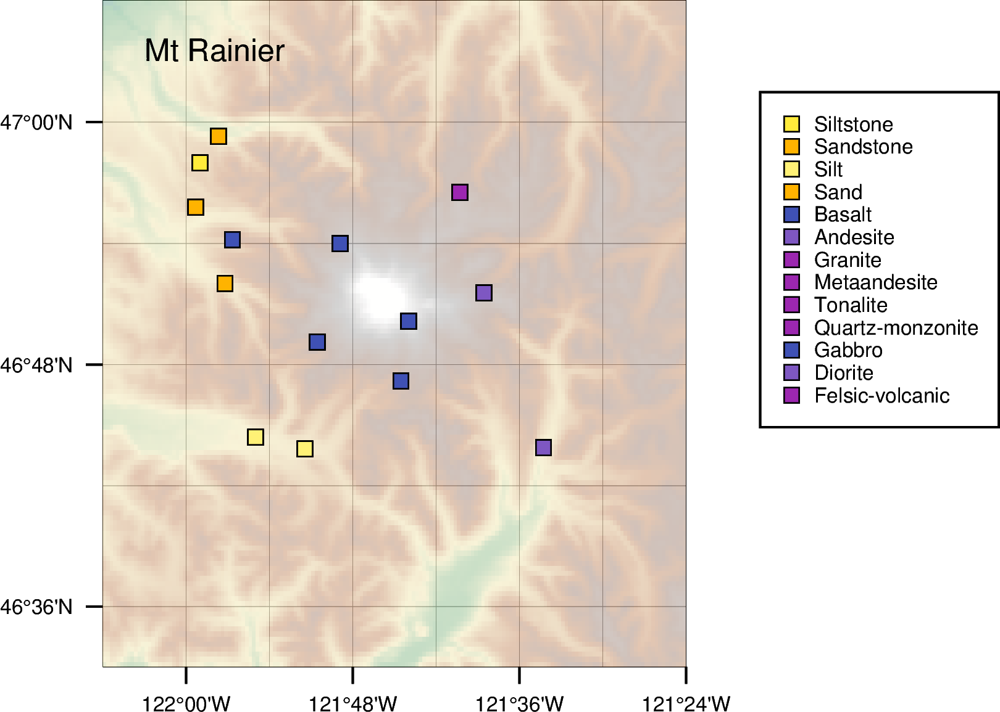

In [50]:
# Load CSV data
df = MtRainer
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable

region=[-122.1, -121.4, 46.55, 47.1]
proj='M4c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a0.2g0.1", )
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=region)
fig.grdimage(grid=grid, projection=proj, transparency=70, cmap='geo')
fig.text(x=-122.05,y=47.05,text=f'Mt Rainier', font="6p,Helvetica,0", no_clip=True, justify="BL" )
    
fig.coast(region=region, projection=proj,  resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)

# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = df[df['color_major'] == color]
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo_x'],
                y=geo_plot['stla_x'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=unit
                )
# Add a legend
fig.legend(position="JMR+o0.2i", box="+gwhite+p0.4p")
fig.show(dpi=600)


/tmp/ipykernel_592990/2871166153.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


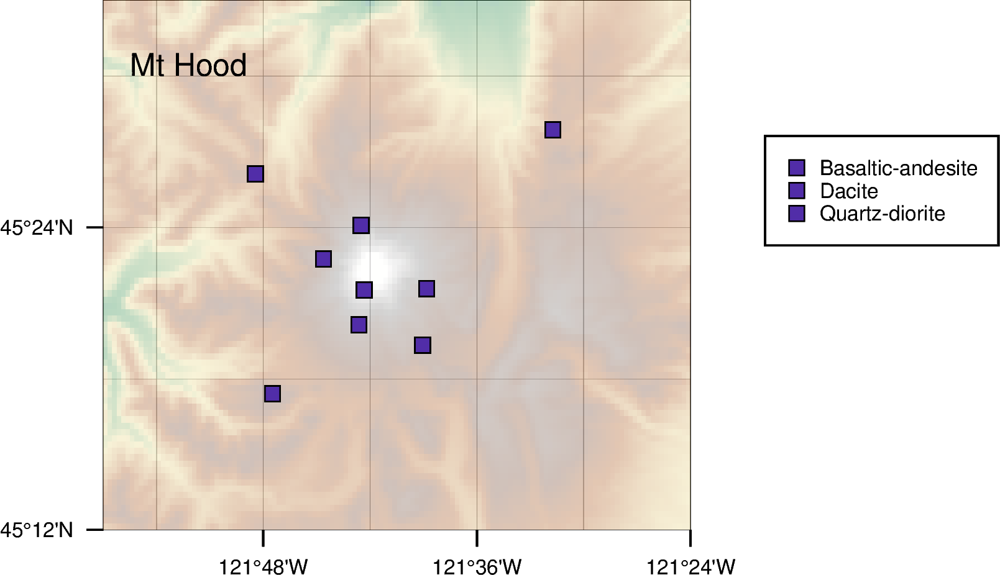

In [51]:
# Load CSV data
df = MtHood
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable

region=[-121.95, -121.4, 45.2, 45.55]
proj='M4c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a0.2g0.1", )
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=region)
fig.grdimage(grid=grid, projection=proj, transparency=70, cmap='geo')
fig.text(x=-121.925,y=45.5,text=f'Mt Hood', font="6p,Helvetica,0", no_clip=True, justify="BL" )

fig.coast(region=region, projection=proj,  resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
            
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = df[df['color_major'] == color]
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo_x'],
                y=geo_plot['stla_x'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=unit
                )
# Add a legend
fig.legend(position="JMR+o0.2i", box="+gwhite+p0.4p")
fig.show(dpi=600)


/tmp/ipykernel_592990/3724418395.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


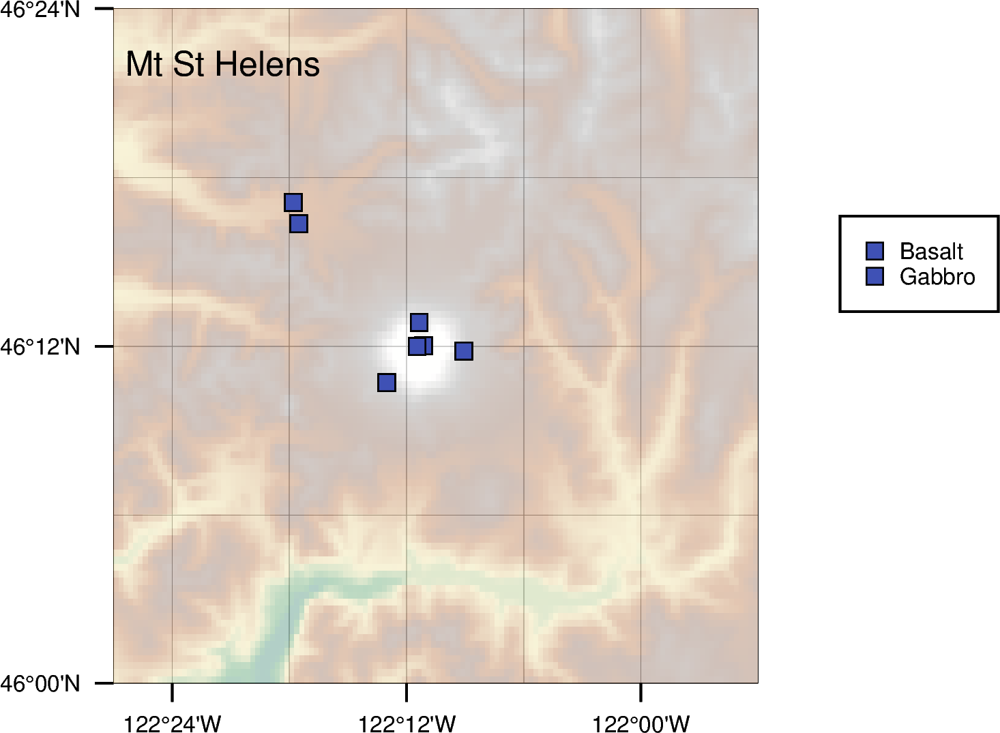

In [52]:
# Load CSV data
df = MtStHelens
df['MAJOR1'] = df['MAJOR1'].astype(str)  # Ensure categorical variable

region=[-122.45, -121.9, 46, 46.4]
proj='M4c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a0.2g0.1", )
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=region)
fig.grdimage(grid=grid, projection=proj, transparency=70, cmap='geo')
fig.text(x=-122.44,y=46.36,text=f'Mt St Helens', font="6p,Helvetica,0", no_clip=True, justify="BL" )

fig.coast(region=region, projection=proj,  resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
            
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = df[df['color_major'] == color]
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo_x'],
                y=geo_plot['stla_x'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=unit
                )
# Add a legend
fig.legend(position="JMR+o0.2i", box="+gwhite+p0.4p")
fig.show(dpi=600)


In [53]:
geo_filtered = merged_geo[merged_geo['MAJOR1'].map(merged_geo['MAJOR1'].value_counts()) > 3]

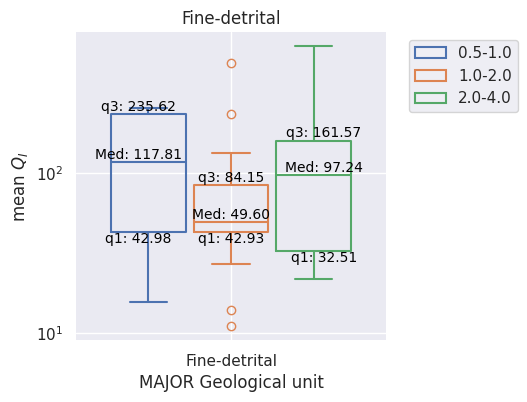

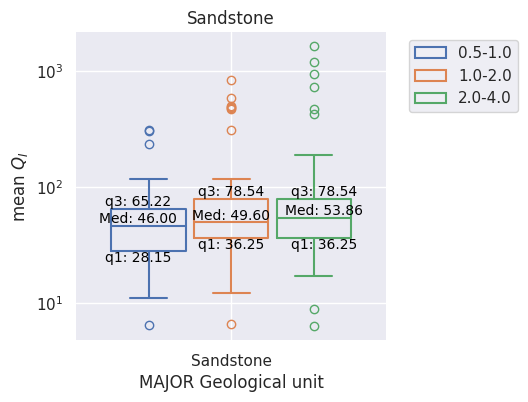

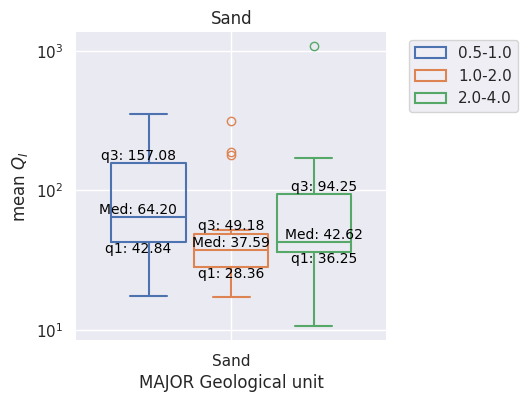

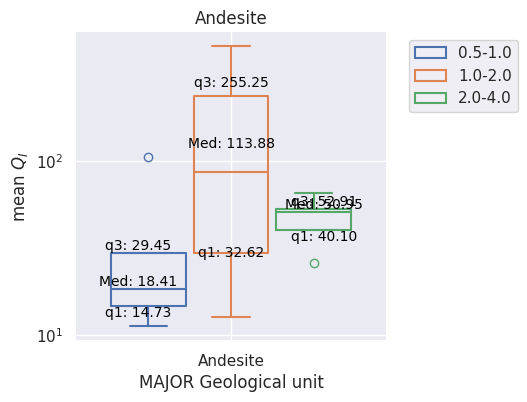

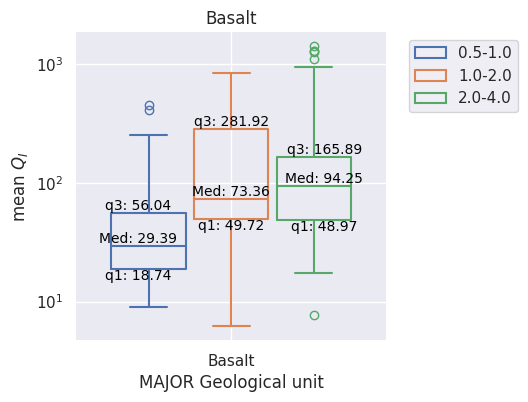

...

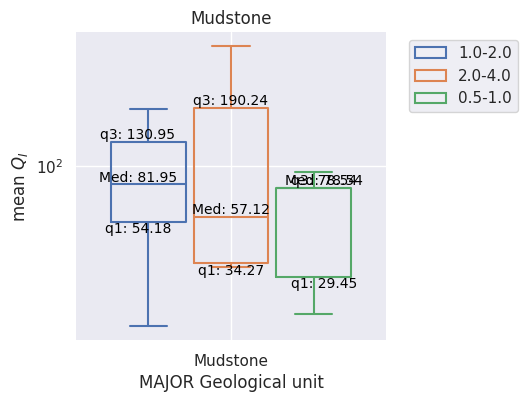

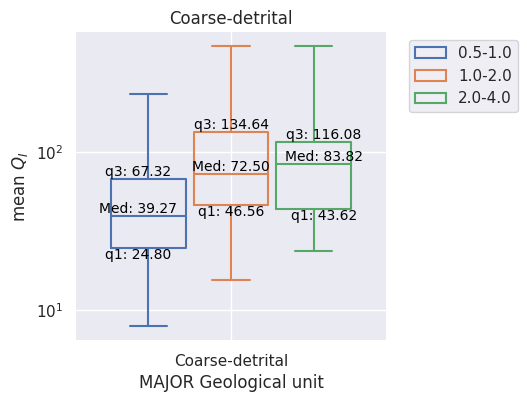

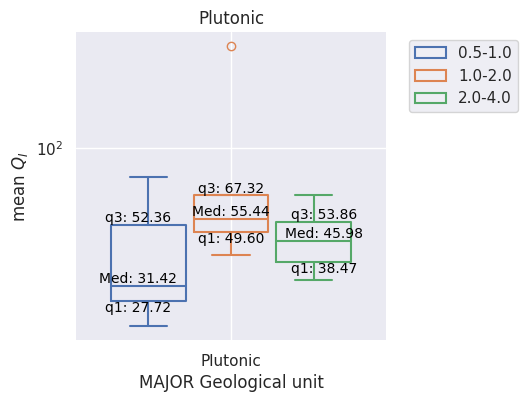

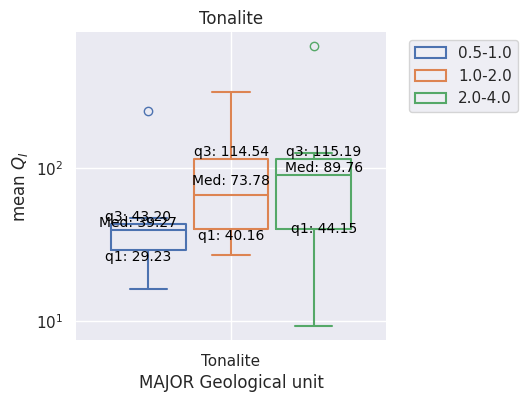

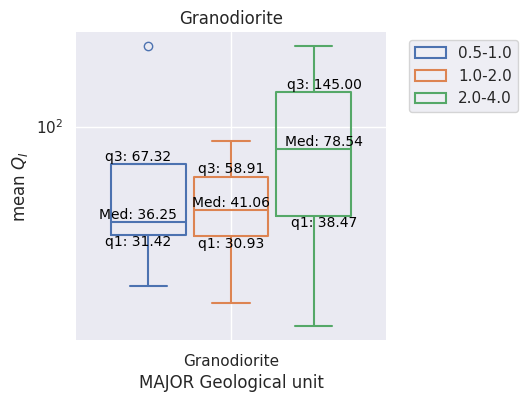

In [54]:
sns.set_theme()
for rock in geo_filtered['MAJOR1'].unique():
    data_geo = geo_filtered[geo_filtered['MAJOR1'] == rock]
    if len(data_geo)<12 :
        continue
    # Initialize the figure with a logarithmic x axis
    f, ax = plt.subplots(figsize=(4,4))
    ax.set_yscale("log")
    sns.boxplot(data=data_geo, y="meanQ", x="MAJOR1", hue="fband", gap=0.1,
                 fill=False,
                )
    # sns.stripplot(data_geo, x="GENERALIZE", y="meanQ", hue="fband", size=2,)
    # sns.violinplot(data=data_geo, y="meanQ", x="GENERALIZE", hue="fband", fill=False,)
    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        med = data_in['meanQ'].median()
        q1 = data_in['meanQ'].quantile(0.25)
        q3 = data_in['meanQ'].quantile(0.75)
        
        # Get the position on the x-axis for the current category
        xpos = n*0.3-0.3
        
        # Plot the mean and quartiles as text on the plot
        ax.text(xpos, med, f'Med: {med:.2f}', ha='center', va='bottom', color='black', fontsize=10)
        ax.text(xpos, q1, f'q1: {q1:.2f}', ha='center', va='top', color='black', fontsize=10)
        ax.text(xpos, q3, f'q3: {q3:.2f}', ha='center', va='bottom', color='black', fontsize=10)

    # Tweak the visual presentation
    ax.xaxis.grid(True)
    ax.yaxis.grid(True)
    ax.set(ylabel="mean $Q_I$", xlabel="MAJOR Geological unit", title=f'{rock}')
    sns.despine(trim=True, left=True)
    ax.legend(loc='upper right', bbox_to_anchor=(1.45, 1), ncol=1)
    # plt.gcf().set_dpi(300)
    plt.show()


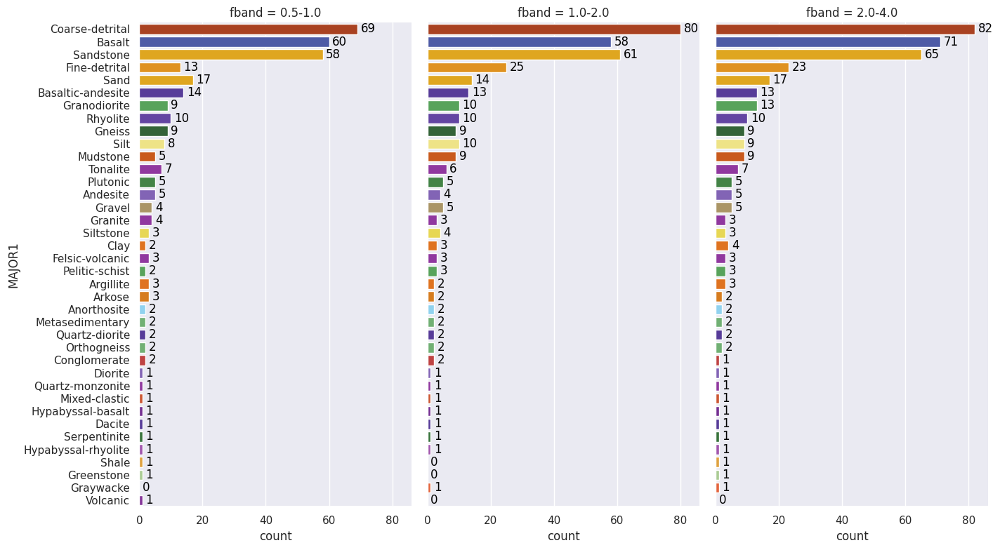

<Figure size 640x480 with 0 Axes>

In [55]:
# Calculate counts for each category of MAJOR1 and sort by count (in descending order)
category_order = merged_geo['MAJOR1'].value_counts().index

# Use sns.catplot instead of sns.displot
g = sns.catplot(
    data=merged_geo, y="MAJOR1", hue="MAJOR1", col="fband", kind="count", legend=False,
    height=8, aspect=0.6, palette=major_colors, order=category_order
)

# Loop over each facet and add count annotations
for ax in g.axes.flat:
    # Get the name of the facet (fband) from the title and filter the data for each facet
    facet_title = ax.get_title().split(" = ")[-1]  # Extracts the facet title after 'fband = '
    data_facet = merged_geo[merged_geo['fband'] == facet_title]
    
    # Count occurrences for each category in MAJOR1, preserving order
    counts = data_facet['MAJOR1'].value_counts().reindex(category_order).fillna(0)

    # Add text for each category's count
    for i, (category, count) in enumerate(counts.items()):
        ax.text(count + 1, i, f'{int(count)}', color='black', ha='left', va='center')

plt.tight_layout()
plt.show()
plt.savefig(fname='GEOunit_histo.png' , dpi=600)

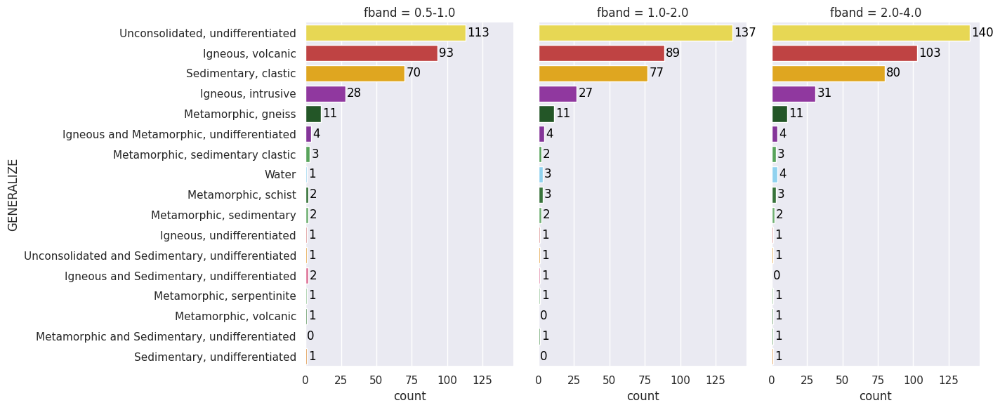

<Figure size 640x480 with 0 Axes>

In [56]:
# Calculate counts for each category of MAJOR1 and sort by count (in descending order)
category_order = merged_geo['GENERALIZE'].value_counts().index

# Use sns.catplot instead of sns.displot
g = sns.catplot(
    data=merged_geo, y="GENERALIZE", hue="GENERALIZE", col="fband", kind="count", legend=False,
    height=6, aspect=0.8, palette=geo_colors, order=category_order
)

# Loop over each facet and add count annotations
for ax in g.axes.flat:
    # Get the name of the facet (fband) from the title and filter the data for each facet
    facet_title = ax.get_title().split(" = ")[-1]  # Extracts the facet title after 'fband = '
    data_facet = merged_geo[merged_geo['fband'] == facet_title]
    
    # Count occurrences for each category in MAJOR1, preserving order
    counts = data_facet['GENERALIZE'].value_counts().reindex(category_order).fillna(0)

    # Add text for each category's count
    for i, (category, count) in enumerate(counts.items()):
        ax.text(count + 1, i, f'{int(count)}', color='black', ha='left', va='center')

plt.tight_layout()
plt.show()
plt.savefig(fname='GEOgener_histo.png' , dpi=600)

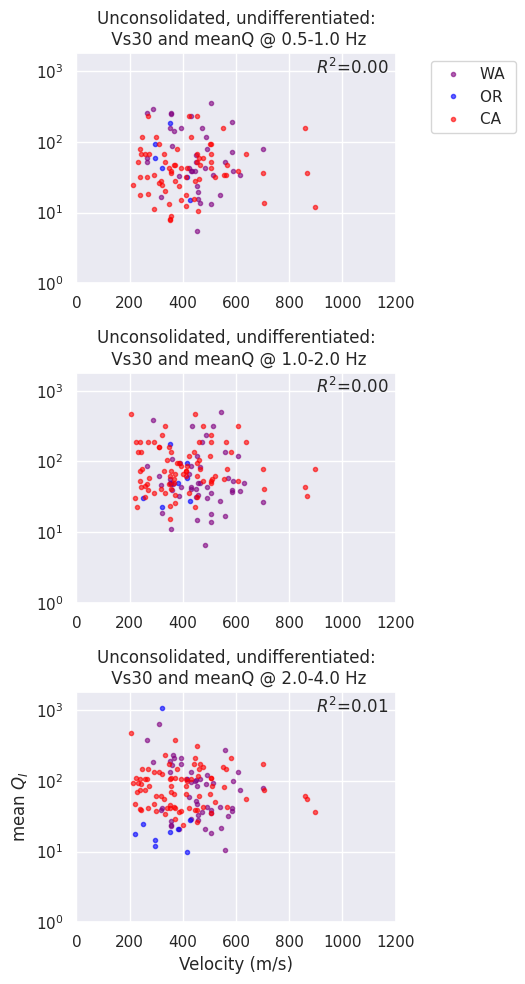

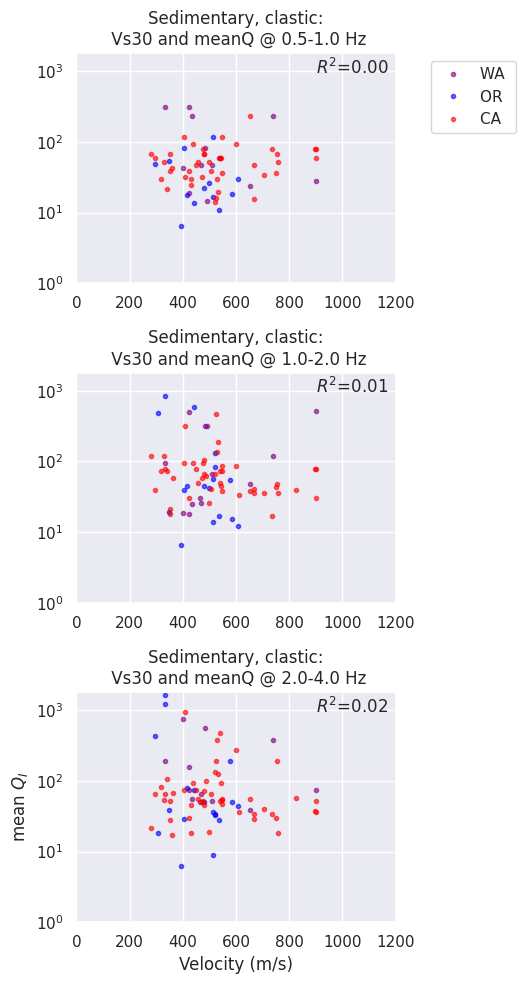

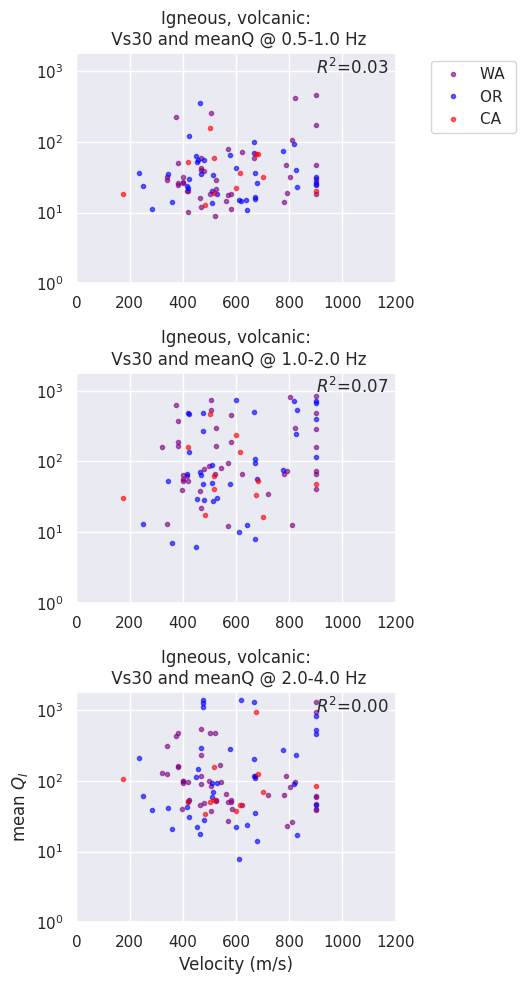

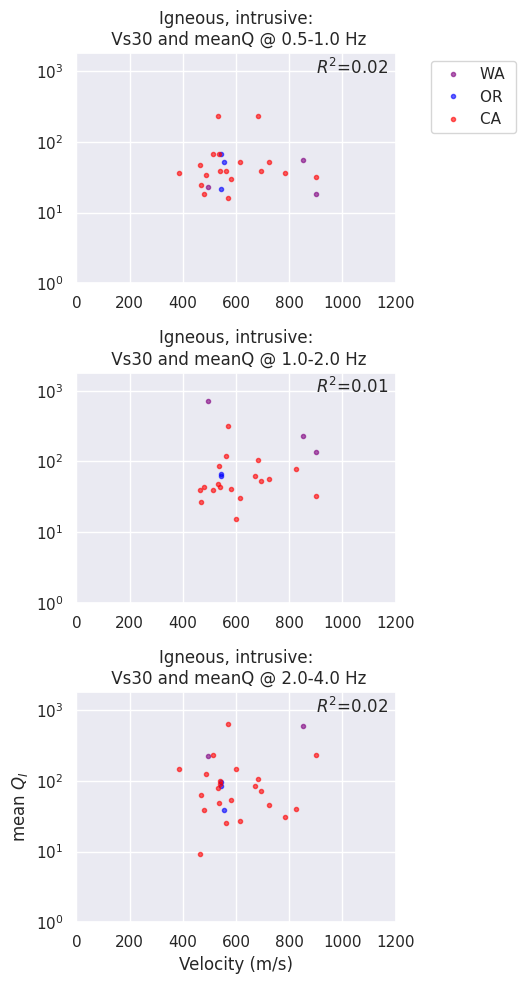

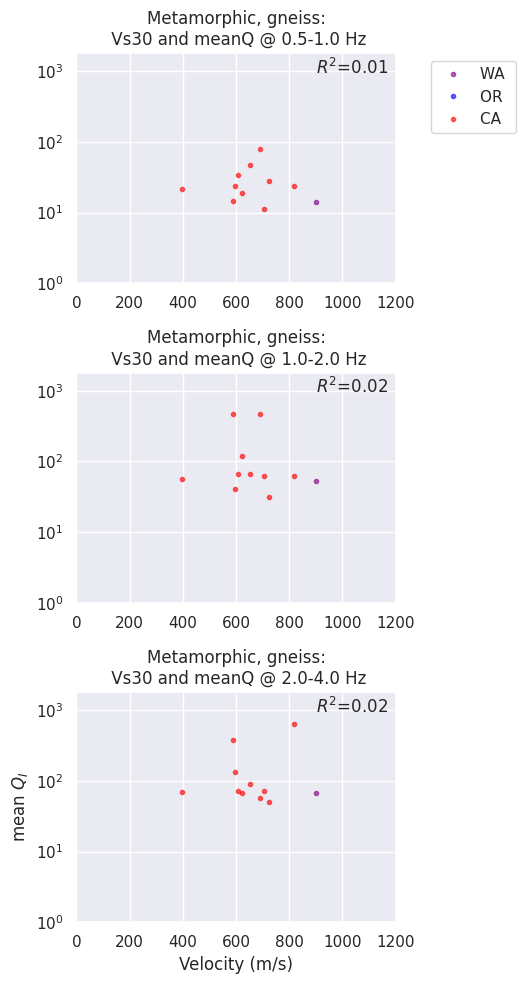

In [57]:


for rock in geo_filtered['GENERALIZE'].unique():
    data_geo = geo_filtered[geo_filtered['GENERALIZE'] == rock]
    data_geo = data_geo[(data_geo['GENERALIZE']== rock) & (data_geo['meanb'] > 0.01)]
    if len(data_geo) < 13:
        continue
    # Initialize the figure with a logarithmic x axis
    f, ax = plt.subplots(3,1,figsize=(6,10))

    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        data_wa = data_in[data_in['STATE'] == 'WA']
        data_ca = data_in[data_in['STATE'] == 'CA']
        data_or = data_in[data_in['STATE'] == 'OR']
        
        ax[n].set_yscale("log")
        ax[n].set_ylim(1,1800)
        ax[n].set_xlim(0,1200)
        
        ax[n].set_title(f'{rock}:\n Vs30 and meanQ @ {fb} Hz')     
        ax[n].plot( data_wa['vs30'], data_wa['meanQ'],'.', label=f'WA ', color='purple', alpha=0.6)
        ax[n].plot( data_or['vs30'], data_or['meanQ'],'.', label=f'OR ', color='blue',   alpha=0.6)
        ax[n].plot( data_ca['vs30'], data_ca['meanQ'],'.', label=f'CA ', color='red', alpha=0.6)     

        R0=np.corrcoef(data_in['vs30'],np.log(data_in['meanQ']))[0,1]
        ax[n].text(0.75,0.91,f'$R^2$={R0**2:.2f}',transform=ax[n].transAxes)
 

    ax[2].set(ylabel="mean $Q_I$", xlabel='Velocity (m/s)')
    ax[0].legend(loc='upper right', bbox_to_anchor=(1.4, 1)).get_frame().set_facecolor('white')
    plt.tight_layout()
    
    


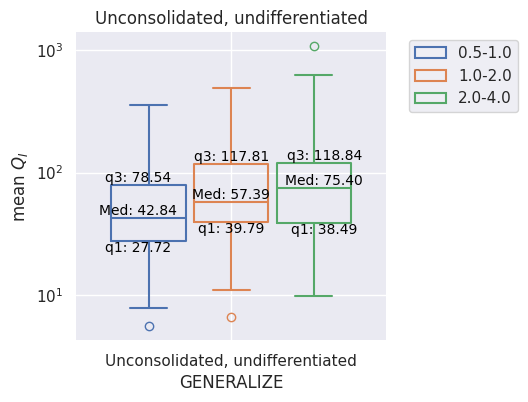

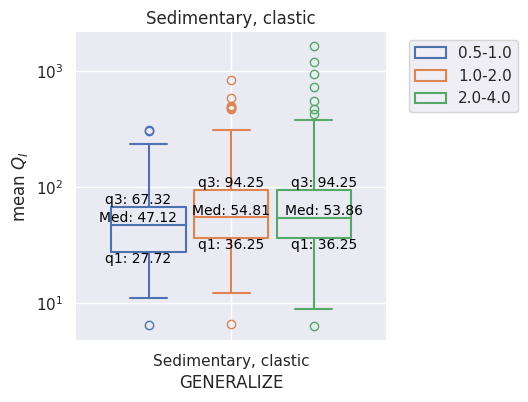

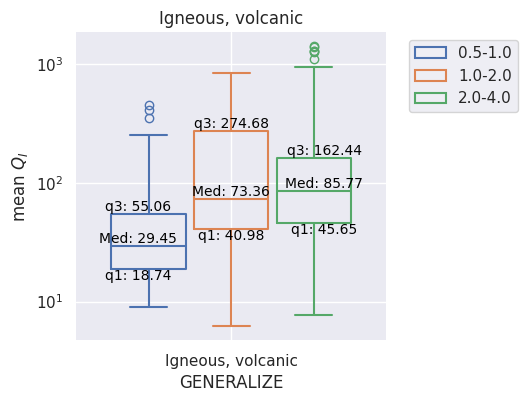

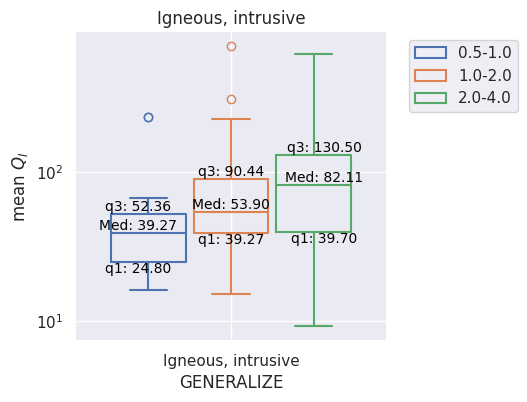

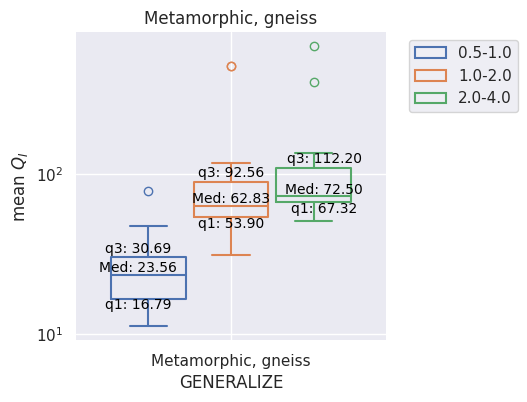

In [58]:
sns.set_theme()
for rock in geo_filtered['GENERALIZE'].unique():
    data_geo = geo_filtered[geo_filtered['GENERALIZE'] == rock]
    if len(data_geo) < 13:
        continue
    # Initialize the figure with a logarithmic x axis
    f, ax = plt.subplots(figsize=(4,4))
    ax.set_yscale("log")
    sns.boxplot(data=data_geo, y="meanQ", x="GENERALIZE", hue="fband", gap=0.1,
                 fill=False,
                )
    # sns.stripplot(data_geo, x="GENERALIZE", y="meanQ", hue="fband", size=2,)
    # sns.violinplot(data=data_geo, y="meanQ", x="GENERALIZE", hue="fband", fill=False,)
    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        med = data_in['meanQ'].median()
        q1 = data_in['meanQ'].quantile(0.25)
        q3 = data_in['meanQ'].quantile(0.75)
        
        # Get the position on the x-axis for the current category
        xpos = n*0.3-0.3
        
        # Plot the mean and quartiles as text on the plot
        ax.text(xpos, med, f'Med: {med:.2f}', ha='center', va='bottom', color='black', fontsize=10)
        ax.text(xpos, q1, f'q1: {q1:.2f}', ha='center', va='top', color='black', fontsize=10)
        ax.text(xpos, q3, f'q3: {q3:.2f}', ha='center', va='bottom', color='black', fontsize=10)

    # Tweak the visual presentation
    ax.xaxis.grid(True)
    ax.yaxis.grid(True)
    ax.set(ylabel="mean $Q_I$", xlabel="GENERALIZE", title=f'{rock}')
    sns.despine(trim=True, left=True)
    ax.legend(loc='upper right', bbox_to_anchor=(1.45, 1), ncol=1)
    # plt.gcf().set_dpi(300)
    plt.show()


In [59]:
print(geo_filtered['MAJOR1'].unique().tolist())

['Fine-detrital', 'Clay', 'Arkose', 'Sandstone', 'Sand', 'Andesite', 'Basalt', 'Granite', 'Silt', 'Quartz-diorite', 'Rhyolite', 'Basaltic-andesite', 'Metasedimentary', 'Gravel', 'Siltstone', 'Conglomerate', 'Pelitic-schist', 'Gneiss', 'Mudstone', 'Coarse-detrital', 'Plutonic', 'Orthogneiss', 'Anorthosite', 'Tonalite', 'Argillite', 'Felsic-volcanic', 'Granodiorite']


Sandstone 0.5-1.0 58
Sandstone 1.0-2.0 61
Sandstone 2.0-4.0 65
Basalt 0.5-1.0 60
Basalt 1.0-2.0 58
Basalt 2.0-4.0 71
Fine-detrital 0.5-1.0 13
Fine-detrital 1.0-2.0 25


Fine-detrital 2.0-4.0 23


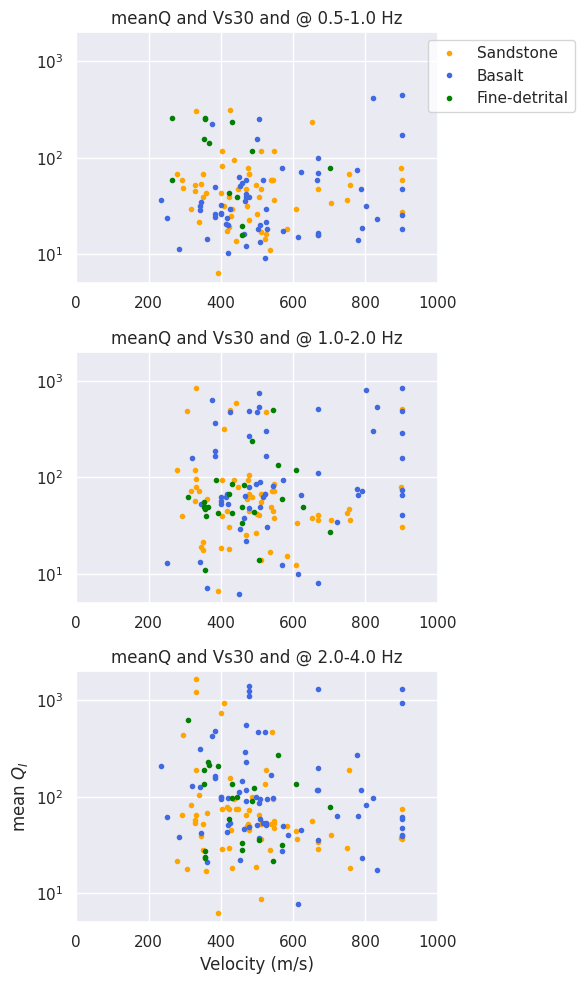

In [62]:
# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(3,1,figsize=(6,10))

selected_rock = ['Sandstone','Basalt','Fine-detrital' ]
colors=['orange','royalblue','green']

for ktype, rock in enumerate(selected_rock):
    data_geo = geo_filtered[geo_filtered['MAJOR1'] == rock]
    data_geo = data_geo[data_geo['MAJOR1']== rock]
    color=colors[ktype]
    for n,fb in enumerate(data_geo.fband.unique()):
        data_in = data_geo[data_geo['fband'] == fb]
        print(rock, fb, len(data_in))
        
        ax[n].set_yscale("log")
        ax[n].set_ylim(5,2000)
        ax[n].set_xlim(0,1000)

        ax[n].set_title(f'meanQ and Vs30 and @ {fb} Hz')
        
        ax[n].plot( data_in['vs30']     ,data_in['meanQ'],'.', label=f'vs30 ', color=color)
        plt.tight_layout()
    ax[2].set(ylabel="mean $Q_I$", xlabel='Velocity (m/s)')
    ax[0].legend(selected_rock, loc='upper right', bbox_to_anchor =(1.4, 1) ).get_frame().set_facecolor('white')
    

plt.show()

